# Profitable localities for Pizza shop in Bangalore

In [55]:
import pandas as pd
import numpy as np
import requests
import folium
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
import time
import os
from selenium import webdriver

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Show/Hide code"></form>''')

## Introduction

Bangalore is one of the metropolitan cities in India with population around close to 10 million (1 Crore). Bangalore is also one of the restaurants hubs in India. You can find all most all cuisines of restaurants in Bangalore, but according to YourStory [article](https://yourstory.com/2017/12/2017-biryani-most-ordered-food-item-pizza-most-searched-on-swiggy), craving for Pizza among Bangaloreans has not gone down. In this project we try to explore profitable localities in Bangalore to open new Pizza restaurant or Pizza shop.

Number of pizza restaurants varies from locality to locality. It depends on population of locality and type of people living in the locality. We expect more pizza restaurants in a locality where there are more software engineers compared to a locality where there are more factory workers. It also depends on number of other restaurants in the locality. Using Foursquare APIs, we can get all the restaurant details as well as all pizza restaurant details. With the help of demographic data and the information obtained from Foursquare, we try to explore the profitable localities in Bangalore to open a new Pizza shop.

## Data

Bangalore political map in geoJSON format was obtained from [Data{Meet}](https://raw.githubusercontent.com/datameet/Municipal_Spatial_Data/master/Bangalore/BBMP.GeoJSON) community. This data has boundary information of 198 wards in Bangalore along with population and area of each ward. Figure below shows the political boundary of 198 wards in Bangalore.

In [56]:
bang_wards = pd.read_csv('C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/bang_df.csv')
bang_wards.head()

,name,lat,lon,pop,area,rest_count,pizza_count
0,Chowdeswari Ward,13.121709,77.580422,19626,7.06,0,0
1,Atturu,13.102805,77.560038,24020,10.15,1,0
2,Yelahanka Satellite Town,13.090987,77.583925,25782,4.90,13,5
3,Vijnanapura,13.006063,77.669565,35087,2.05,0,0
4,Basavanapura,13.016847,77.715456,22012,6.28,0,0


In [57]:
latitude = 12.979682
longitude = 77.610761

bang_map = folium.Map(location=[latitude, longitude], zoom_start=11)

folium.Choropleth(
    geo_data='C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/map.geojson',
    fill_color='BuPu',
    fill_opacity=0.1,
    line_opacity=0.8,
).add_to(bang_map)
    
bang_map

Using this ward information as the desired neighborhood, all the dinner restaurants in these wards were collected from [Foursquare](https://developer.foursquare.com/) using their APIs. Figure below maps all the dinner restaurants in Bangalore.

In [58]:
bang_dinner = pd.read_csv('C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/restraunt_list.csv')
bang_dinner.head()

,X,Neighborhood,Neighborhood.Latitude,Neighborhood.Longitude,Venue,Venue.Latitude,Venue.Longitude,Venue.Category
0,76,Bangalore,12.863477,77.531214,Swadeshi's,12.867092,77.535141,Indian Restaurant
1,104,Bangalore,12.863477,77.622125,New Ganesh Bhavan,12.859146,77.613619,Indian Restaurant
2,108,Bangalore,12.863477,77.644853,Infosys - Lotus Food Court,12.868686,77.653951,Food Court
3,118,Bangalore,12.881355,77.553941,Adyar Ananda Bhavan (A2B),12.883416,77.548695,South Indian Restaurant
4,119,Bangalore,12.881355,77.553941,Vasudev Adigas's,12.882507,77.546648,Indian Restaurant


In [59]:
latitude = 12.979682
longitude = 77.610761

bang_map = folium.Map(location=[latitude, longitude], zoom_start=11)

for lat, lon, poi in zip(bang_dinner['Venue.Latitude'], bang_dinner['Venue.Longitude'], bang_dinner['Venue']):
    label = folium.Popup(str(poi), parse_html=True)
    folium.Circle(
        [lat, lon],
        popup=label,
        radius=2,
        fill=True,
        fill_opacity=0.9).add_to(bang_map)
    
folium.Choropleth(
    geo_data='C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/map.geojson',
    fill_color='BuPu',
    fill_opacity=0.1,
    line_opacity=0.8,
).add_to(bang_map)
    
bang_map

Using the same APIs, all the pizza restaurants information was also collected. Figure below maps all pizza restaurants. With details of all the restaurants, population size, we try to do exploratory data analysis to figure out profitable wards Bangalore to open pizza restaurants.

In [60]:
bang_pizza = pd.read_csv('C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/pizza.csv')
bang_pizza.head()

,X,Neighborhood,Neighborhood.Latitude,Neighborhood.Longitude,Venue,Venue.Latitude,Venue.Longitude,Venue.Category
0,1,Bangalore,12.845599,77.576669,Cafe Pascucci,12.889747,77.581906,Café
1,2,Bangalore,12.845599,77.576669,Intalia,12.876085,77.595524,Pizza Place
2,3,Bangalore,12.845599,77.576669,Domino's Pizza,12.888000,77.585000,Pizza Place
3,4,Bangalore,12.845599,77.576669,TGI Fridays,12.875705,77.595088,American Restaurant
4,14,Bangalore,12.899232,77.508486,Domino's Pizza,12.928832,77.518435,Pizza Place


In [61]:
latitude = 12.979682
longitude = 77.610761

bang_map = folium.Map(location=[latitude, longitude], zoom_start=11)

    
for lat, lon, poi in zip(bang_pizza['Venue.Latitude'], bang_pizza['Venue.Longitude'], bang_pizza['Venue']):
    label = folium.Popup(str(poi), parse_html=True)
    folium.Circle(
        [lat, lon],
        color='red',
        popup=label,
        radius=2,
        fill=True,
        fill_opacity=0.9).add_to(bang_map)
    
folium.Choropleth(
    geo_data='C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/map.geojson',
    fill_color='BuPu',
    fill_opacity=0.1,
    line_opacity=0.8,
).add_to(bang_map)
    
bang_map

In figure below, both dinner restaurants and pizza restaurants are mapped.

In [62]:
latitude = 12.979682
longitude = 77.610761

bang_map = folium.Map(location=[latitude, longitude], zoom_start=11)

for lat, lon, poi in zip(bang_dinner['Venue.Latitude'], bang_dinner['Venue.Longitude'], bang_dinner['Venue']):
    label = folium.Popup(str(poi), parse_html=True)
    folium.Circle(
        [lat, lon],
        popup=label,
        radius=2,
        fill=True,
        fill_opacity=0.9).add_to(bang_map)
    
for lat, lon, poi in zip(bang_pizza['Venue.Latitude'], bang_pizza['Venue.Longitude'], bang_pizza['Venue']):
    label = folium.Popup(str(poi), parse_html=True)
    folium.Circle(
        [lat, lon],
        color='red',
        popup=label,
        radius=2,
        fill=True,
        fill_opacity=0.9).add_to(bang_map)
    
folium.Choropleth(
    geo_data='C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/map.geojson',
    fill_color='BuPu',
    fill_opacity=0.1,
    line_opacity=0.8,
).add_to(bang_map)
    
bang_map

## Methodology and Results

Number of pizza restaurants in a ward depends on number of total restaurants in a ward and population size in that ward. If there are more dinner restaurants, we expect more pizza restaurants as well. If there are more people in the ward, we expect a greater number of pizza restaurants. As we have count data, we fit Poisson regression with number of pizza restaurants as response $y$, number of dinner restaurants and population in the ward as explanatory variables $x_1$ and $x_2$ respectively. Initial graphical analysis is given in Figure below. From this, plot we can see that many wards have pizza counts and restaurants counts as zero. Hence this is a zero inflated model.  Also, pizza count increases as restaurant count increases. Population of the ward has no relationship with number of pizza restaurants. The Poisson regression equation is given by $$ \log \lambda_i = \beta_0 + \beta_1 x_1 + \beta_2 x_2$$ where $\lambda_i$ is the rate parameter for each ward. Once the model was fit, we calculated regression co-efficients $\beta_0$, $\beta_1$ and $\beta_2$. All these co-efficients turned out to be significant. Using these co-efficients we calculate expected number of pizza restaurants $\hat{y_i}$ in each ward.

In [64]:
X = bang_wards[['rest_count','pop']]
y = bang_wards['pizza_count']
Z = pd.concat([X.reset_index(drop=True), y], axis=1)

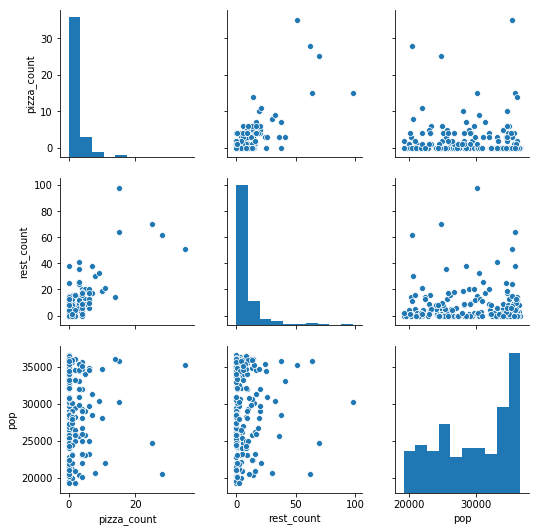

In [65]:
sns.pairplot(Z[['pizza_count','rest_count','pop']])

Below is the summary of the poisson regression.

In [66]:
formula = 'pizza_count ~ rest_count + pop'

mod1 = smf.glm(formula=formula, data=Z, family=sm.families.Poisson()).fit()
mod1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:            pizza_count   No. Observations:                  198
Model:                            GLM   Df Residuals:                      195
Model Family:                 Poisson   Df Model:                            2
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -410.59
Date:                Fri, 29 Mar 2019   Deviance:                       600.78
Time:                        22:41:27   Pearson chi2:                     687.
No. Iterations:                     6   Covariance Type:             nonrobust
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6200      0.302      2.052      0.040       0.028       1.212
rest_count     0.0414      0.001     28.079      0.000       0.039       0.044
pop        -2.212e-05   1.02e-05     -2.164      0.030   -4.22e-05   -2.09e-06
==============================================================================
"""

 Residual for each ward is calculated as $e_i=\hat{y_i}-y_i$. If this residual is positive, we expect more pizza restaurants in the ward than the number of pizza restaurants actually present. If residual is negative, there are already more pizza restaurants in the ward than expected according to this model. These residuals were plotted in Figure below.

In [70]:
Z['residual'] = pd.Series(mod1.predict(X)-y, index=Z.index)
Z['ward'] = pd.Series(range(1,199), index=Z.index)
Z['name'] = pd.Series(bang_wards['name'], index=Z.index)
bang_map = folium.Map(location=[latitude, longitude], zoom_start=11)
folium.Choropleth(
    geo_data='C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/map.geojson',
    data = Z,
    columns = ['ward','residual'],
    key_on='feature.properties.OBJECTID',
    fill_color='RdBu',
    fill_opacity=0.8,
    line_opacity=0.8,
    popup=folium.Popup(Z['name'], parse_html=True)
).add_to(bang_map)
    
bang_map

__Shantala Nagar__ which is blue in color __has very less pizza restaurants than expected__, on the other hand, __Koramangala__ which is in dark red color __has more pizza restaurants than expected.__ Below is the list of top 10 restaurants who have less than and more than expected pizza shops. Top 10 localities which have pizza restaurants less than expected are the profitable localities to open a pizza shop. Top 10 localities with pizza restaurants more than expected are the localities with overcrowded pizza restaurants.

### More than expected count

In [71]:
Z.nsmallest(10,'residual')['name']

156             Koramangala
165              Bellanduru
80        Jeevanbhima Nagar
169          Dodda Nekkundi
89                   Domlur
65           Pulikeshinagar
170              HSR Layout
44           Aramane Nagara
14          Byatarayanapura
22     Rajarajeshwari Nagar
Name: name, dtype: object

### Less than expected count

In [72]:
Z.nlargest(10,'residual')['name']

88        Shantala Nagar
84               Halsoor
160           BTM Layout
174           Bilekhalli
196         Marathahalli
81     Sampangiram Nagar
173         Puttenahalli
87         Vasanth Nagar
162           Byrasandra
99           Gandhinagar
Name: name, dtype: object

This model has many wards with both restaurants and pizza shop counts as zeroes in them. These wards affect our model fitting. To simplify this, we remove all the wards which have pizza restaurant count as zero. We fit the same model after all zero counts were removed. Figure below depicts all pairwise plot for pizza count, restaurant count and population for each ward. Again, pizza count increases as restaurant count increases. Population of the ward has no relationship with number of pizza restaurants. We fit the same model and plot the residual plot similar to the above-mentioned procedure. 

In [73]:
X = bang_wards[['rest_count','pop']]
y = bang_wards['pizza_count']
Z = pd.concat([X.reset_index(drop=True), y], axis=1)
Z['ward'] = pd.Series(range(1,199), index=Z.index)
Z['name'] = pd.Series(bang_wards['name'], index=Z.index)
Z1 = Z[(Z[['pizza_count']] != 0).all(axis=1)]

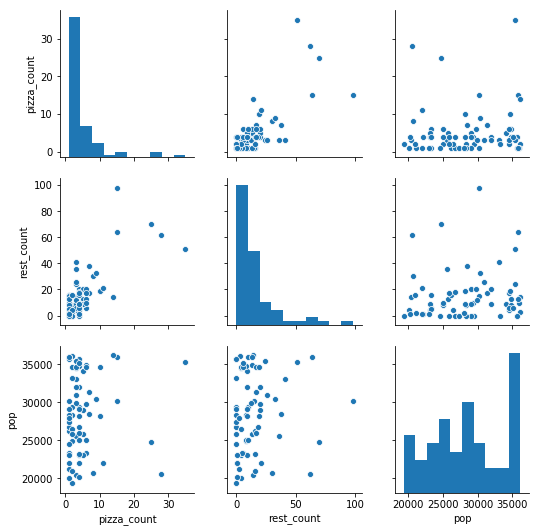

In [74]:
sns.pairplot(Z1[['pizza_count','rest_count','pop']])

Below is the summary of the new model without zero counts.

In [75]:
formula = 'pizza_count ~ rest_count + pop'

mod2 = smf.glm(formula=formula, data=Z1, family=sm.families.Poisson()).fit()
mod2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:            pizza_count   No. Observations:                   71
Model:                            GLM   Df Residuals:                       68
Model Family:                 Poisson   Df Model:                            2
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -186.91
Date:                Fri, 29 Mar 2019   Deviance:                       153.42
Time:                        22:47:30   Pearson chi2:                     169.
No. Iterations:                     5   Covariance Type:             nonrobust
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.8788      0.310      2.834      0.005       0.271       1.487
rest_count     0.0264      0.002     15.521      0.000       0.023       0.030
pop          6.39e-06   1.06e-05      0.605      0.545   -1.43e-05    2.71e-05
==============================================================================
"""

In [76]:
X1 = X.loc[Z1.index,:]
y1 = y[Z1.index]
Z1['residual'] = pd.Series(mod2.predict(X1)-y1, index=Z1.index)
Z['new_residual'] = pd.Series(range(198), index=Z.index)
Z1.head()
for i in Z.index:
    if( i in Z1.index):
        Z.loc[i,'new_residual'] = Z1.loc[i,'residual']
    else:
         Z.loc[i,'new_residual'] = 0

C:\Users\suhas\AppData\Local\Programs\Python\Python37-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Figure below depicts the residuals for each of the wards. In this model, variation of residual has reduced. Shantala Nagar which is dark blue in color has very less pizza restaurants than expected, on the other hand, Koramangala which is in dark red color has more pizza restaurants than expected.

In [77]:
bang_map = folium.Map(location=[latitude, longitude], zoom_start=11)
folium.Choropleth(
    geo_data='C:/Users/suhas/OneDrive/Battle of Neighborhood/Pizza/map.geojson',
    data = Z,
    columns = ['ward','new_residual'],
    key_on='feature.properties.OBJECTID',
    fill_color='RdBu',
    fill_opacity=0.8,
    line_opacity=0.8,
    popup=folium.Popup(Z['name'], parse_html=True)
).add_to(bang_map)
    
bang_map

Below is the ists the top 10 restaurants who have less than and more than expected pizza shops according to new model.

### More than expected count

In [78]:
Z.nsmallest(10,'new_residual')['name']

156             Koramangala
165              Bellanduru
80        Jeevanbhima Nagar
170              HSR Layout
169          Dodda Nekkundi
65           Pulikeshinagar
89                   Domlur
22     Rajarajeshwari Nagar
14          Byatarayanapura
178                 Arakere
Name: name, dtype: object

### Less than expected count

In [79]:
Z.nlargest(10,'new_residual')['name']

88               Shantala Nagar
81            Sampangiram Nagar
87                Vasanth Nagar
51     Radhakrishna Temple Ward
148                  Karisandra
157            Suddagunte Palya
142                Basavanagudi
161           Pattabhiram Nagar
100               Subhash Nagar
153                 Lakkasandra
Name: name, dtype: object

Top 10 wards which have pizza shops more than expected with the new model are almost the same as the old model. But top 10 wards which have pizza shops less than expected have changed except Shantala nagar which top in both the models.

# Conclusion

In [8]:
#CLIENT_ID = 'MZY14SRHWBY5RH3Q1CWTIN2GXVPRPXB1TYDIJIJTGR1SRESP'
#CLIENT_SECRET = 'YR1UZK5C1FNS5B5XNVITPIQALNGVGC0KB2TGS1VSQR53A0LP'

#VERSION = '20190326'

#def getNearbyVenuesNew(names, latitudes, longitudes, radius=500, query=None):
    
  #  venues_list=[]
    #for name, lat, lng in zip(names, latitudes, longitudes):
      #  try:  
        #    # create the API request URL
          #  if(query!=None):
            #    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}'.format(
              #      CLIENT_ID, 
                #    CLIENT_SECRET, 
                  #  VERSION, 
                    #lat, 
#                    lng, 
  #                  radius, 
    #                100,
      #              query)
        #    else:
          #      url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            #        CLIENT_ID, 
              #      CLIENT_SECRET, 
                #    VERSION, 
                  #  lat, 
                    #lng, 
#                    radius, 
  #                  100)
           # print(url)
            # make the GET request
    #        results = requests.get(url).json()["response"]['groups'][0]['items']
            # return only relevant information for each nearby venue
      #      venues_list.append([(
        #    name, 
          #  lat, 
            #lng, 
#            v['venue']['name'], 
  #          v['venue']['location']['lat'], 
    #        v['venue']['location']['lng'],  
      #      v['venue']['categories'][0]['name']) for v in results])
                #print(venues_list)
                
        #except:
          #  pass
#    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
  #  nearby_venues.columns = ['Neighborhood', 
    #'Neighborhood Latitude', 
#    'Neighborhood Longitude', 
  #  'Venue', 
    #'Venue Latitude', 
#    'Venue Longitude', 
  #  'Venue Category']
    #return(nearby_venues)

#def drange(x, y, jump):
  #  while x <= y:
    #    yield float(x)
      #  x += jump

In [7]:
#bang_dinner = getNearbyVenuesNew(names=bang_wards['WARD_NAME'],
  #                                 latitudes=bang_wards['LAT'],
    #                               longitudes=bang_wards['LON'],
      #                             radius = 5000,
        #                           query='dinner'
          #                        )

In [10]:
#bang_dinner_rest = bang_dinner.drop_duplicates(subset=['Venue','Venue Latitude','Venue Longitude'],keep='first')